In [1]:
import pandas as pd
import numpy as np

CSV = "snomad_snocvr_obs_202409_202505.csv"

# -------------------------
# 1) Load + basic cleaning
# -------------------------
df = pd.read_csv(CSV)

df["valid_time"] = pd.to_datetime(df["valid_time"], utc=True, errors="coerce")
df = df.dropna(subset=["station_id", "valid_time", "obs_totalSnowDepth_mm"])

# Ensure numeric first
df["obs_totalSnowDepth_mm"] = pd.to_numeric(df["obs_totalSnowDepth_mm"], errors="coerce")

df.loc[df["obs_totalSnowDepth_mm"] < -1e30, "obs_totalSnowDepth_mm"] = np.nan

# Now drop missing
df = df.dropna(subset=["station_id", "valid_time", "obs_totalSnowDepth_mm"])

# Sort for time-diff logic
df = df.sort_values(["station_id", "valid_time"])

# If duplicates exist at same station/time, keep last (or change to mean)
df = df.drop_duplicates(subset=["station_id", "valid_time"], keep="last")

In [2]:
# 2) First difference: delta x (negative only focus)
# ---------------------------------------------------
df["delta_mm"] = df.groupby("station_id")["obs_totalSnowDepth_mm"].diff()
df["neg_delta_mm"] = df["delta_mm"].where(df["delta_mm"] < 0)

# Optional: time gap (can be useful to exclude weird gaps)
df["dt_hours"] = df.groupby("station_id")["valid_time"].diff().dt.total_seconds() / 3600.0


In [3]:
# 3) Data-driven thresholds from NEGATIVE delta dist
# ---------------------------------------------------
neg = df["neg_delta_mm"].dropna()

# Robust option (recommended): median + MAD -> robust sigma
median_neg = neg.median()
mad = np.median(np.abs(neg - median_neg))
robust_sigma = 1.4826 * mad if mad > 0 else neg.std(ddof=1)

# Classic mean/std (keep as well for comparison)
mean_neg = neg.mean()
std_neg = neg.std(ddof=1)

# Choose one scheme for thresholds (robust is usually better with fat tails/outliers)
thr_1s = median_neg - 1 * robust_sigma
thr_2s = median_neg - 2 * robust_sigma
thr_3s = median_neg - 3 * robust_sigma

df["melt_flag_1s"] = df["neg_delta_mm"] < thr_1s
df["melt_flag_2s"] = df["neg_delta_mm"] < thr_2s
df["melt_flag_3s"] = df["neg_delta_mm"] < thr_3s

print("NEG-DELTA thresholding (robust):")
print(f"  median_neg = {median_neg:.3f} mm")
print(f"  robust_sigma ≈ {robust_sigma:.3f} mm")
print(f"  1σ thr: neg_delta < {thr_1s:.3f} mm")
print(f"  2σ thr: neg_delta < {thr_2s:.3f} mm")
print(f"  3σ thr: neg_delta < {thr_3s:.3f} mm")

NEG-DELTA thresholding (robust):
  median_neg = -20.000 mm
  robust_sigma ≈ 14.826 mm
  1σ thr: neg_delta < -34.826 mm
  2σ thr: neg_delta < -49.652 mm
  3σ thr: neg_delta < -64.478 mm


In [4]:
# 4) "Std dev of the negative tendency" per station
# ---------------------------------------------------
df_melt = df[df["neg_delta_mm"].notna()].copy()

station_stats = (
    df_melt.groupby("station_id")
    .agg(
        lat=("lat", "first"),
        lon=("lon", "first"),
        elev_m=("elev_m", "first"),
        n_obs=("obs_totalSnowDepth_mm", "count"),
        n_melt_events=("neg_delta_mm", "count"),
        neg_mean_mm=("neg_delta_mm", "mean"),
        neg_std_mm=("neg_delta_mm", "std"),
        pct_melt_1s=("melt_flag_1s", "mean"),
        pct_melt_2s=("melt_flag_2s", "mean"),
        pct_melt_3s=("melt_flag_3s", "mean"),
    )
    .reset_index()
)

# Optional: convert pct columns to percent
for c in ["pct_melt_1s", "pct_melt_2s", "pct_melt_3s"]:
    station_stats[c] = 100.0 * station_stats[c]

In [5]:
# 5) Optional: true "second derivative" of x
#    (second difference) + its std dev during melt
# ---------------------------------------------------
df["delta2_mm"] = df.groupby("station_id")["delta_mm"].diff()

# "melt regime" mask: only consider second differences when we're melting at time t
df["delta2_during_melt_mm"] = df["delta2_mm"].where(df["neg_delta_mm"].notna())

station_delta2 = (
    df[df["delta2_during_melt_mm"].notna()]
    .groupby("station_id")
    .agg(
        delta2_std_mm=("delta2_during_melt_mm", "std"),
        delta2_mean_mm=("delta2_during_melt_mm", "mean"),
        n_delta2=("delta2_during_melt_mm", "count"),
    )
    .reset_index()
)

station_stats = station_stats.merge(station_delta2, on="station_id", how="left")

In [6]:
# 6) Outputs for plotting
# ---------------------------------------------------
# Event-level frame for time series highlighting
df_events = df[
    [
        "station_id", "valid_time", "lat", "lon", "elev_m", "month",
        "obs_totalSnowDepth_mm", "delta_mm", "neg_delta_mm", "dt_hours",
        "melt_flag_1s", "melt_flag_2s", "melt_flag_3s",
        "delta2_mm"
    ]
].copy()

# Save for reuse
df_events.to_csv("snomad_snocvr_events_with_melt_metrics.csv", index=False)
station_stats.to_csv("snomad_snocvr_station_melt_summary.csv", index=False)

print("\nWrote:")
print("  snocvr_events_with_melt_metrics.csv")
print("  snocvr_station_melt_summary.csv")

# Quick peek
print("\nTop 10 stations by % extreme melt (2σ):")
print(station_stats.sort_values("pct_melt_2s", ascending=False).head(10)[
    ["station_id", "pct_melt_2s", "neg_mean_mm", "neg_std_mm", "delta2_std_mm", "n_melt_events"]
])


Wrote:
  snocvr_events_with_melt_metrics.csv
  snocvr_station_melt_summary.csv

Top 10 stations by % extreme melt (2σ):
     station_id  pct_melt_2s  neg_mean_mm  neg_std_mm  delta2_std_mm  \
2         0013R        100.0       -130.0         NaN            NaN   
5308      8999S        100.0        -60.0         NaN            NaN   
5306      8995Z        100.0        -50.0         NaN            NaN   
5305      8992Z        100.0       -270.0         NaN            NaN   
3647      6136O        100.0       -110.0         NaN            NaN   
5313      9004C        100.0       -210.0         NaN            NaN   
4588      76951        100.0       -110.0   42.426407     296.984848   
4579      7684B        100.0       -100.0   56.568542     268.700577   
4586      76930        100.0        -60.0         NaN            NaN   
5610      9584W        100.0       -100.0         NaN            NaN   

      n_melt_events  
2                 1  
5308              1  
5306              1 

In [7]:
import pandas as pd
import numpy as np

def build_station_melt_rankings(
    df,
    value_col="obs_totalSnowDepth_mm",
    time_col="valid_time",
    station_col="station_id",
    min_events=10,
    sigma_level=2,
):
    d = df.copy()
    d[time_col] = pd.to_datetime(d[time_col], utc=True, errors="coerce")
    d[value_col] = pd.to_numeric(d[value_col], errors="coerce")
    d = d.dropna(subset=[station_col, time_col, value_col])
    d = d.sort_values([station_col, time_col]).drop_duplicates([station_col, time_col], keep="last")

    # First difference + negative-only
    d["delta_mm"] = d.groupby(station_col)[value_col].diff()
    d["neg_delta_mm"] = d["delta_mm"].where(d["delta_mm"] < 0)

    neg_all = d["neg_delta_mm"].dropna()
    if neg_all.empty:
        raise ValueError("No negative deltas found. Check input data / value column.")

    # =======================================================
    
    # NOTE: We are not calculating the actual standard deviation because this data for
    # our negative deltas include a mixture of real physical melt / compaction as
    # well as sensor resets and reporting glitches. The large drops that are included
    # inflate the actual standard deviation. Robust sigma gives us the typical spread
    # of normal melt behavior, centering on the median, not the mean. 

    # =======================================================
    
    # Robust global threshold: median - N * robust_sigma(MAD)
    med = neg_all.median()
    # Calculate median absolute deviation
    mad = np.median(np.abs(neg_all - med))
    # Use scaling factor 1.4826 to make MAD behave like standard deviation for normal distribution
    robust_sigma = 1.4826 * mad if mad > 0 else neg_all.std(ddof=1)
    # Calculate Threshold
    thr = med - sigma_level * robust_sigma

    d["extreme_melt"] = d["neg_delta_mm"] < thr

    # Optional: "second derivative" during melt (volatility of delta)
    d["delta2_mm"] = d.groupby(station_col)["delta_mm"].diff()
    d["delta2_during_melt_mm"] = d["delta2_mm"].where(d["neg_delta_mm"].notna())

    # Station stats
    st = (
        d.groupby(station_col)
        .agg(
            lat=("lat", "first"),
            lon=("lon", "first"),
            elev_m=("elev_m", "first"),
            n_obs=(value_col, "count"),
            n_melt_events=("neg_delta_mm", lambda x: x.notna().sum()),
            neg_mean_mm=("neg_delta_mm", "mean"),
            neg_std_mm=("neg_delta_mm", "std"),
            n_extreme=("extreme_melt", "sum"),
            pct_extreme=("extreme_melt", "mean"),
            delta2_std_mm=("delta2_during_melt_mm", "std"),
        )
        .reset_index()
    )

    # Clean up percents
    st["pct_extreme"] = 100.0 * st["pct_extreme"].fillna(0.0)

    # Filter: need enough melt events to be meaningful
    st = st[st["n_melt_events"] >= min_events].copy()

    # A simple composite “badness” score:
    # - pct_extreme drives it (how often extreme drops happen)
    # - neg_std_mm adds “noisiness” of melt
    # - delta2_std_mm adds volatility of change-of-change (optional)
    # Use logs to keep scales sane.
    st["score"] = (
        st["pct_extreme"].fillna(0)
        * np.log1p(st["neg_std_mm"].fillna(0))
        * np.log1p(st["delta2_std_mm"].fillna(0))
    )

    meta = {
        "sigma_level": sigma_level,
        "threshold_mm": float(thr),
        "global_median_neg": float(med),
        "robust_sigma": float(robust_sigma),
        "min_events": min_events,
    }
    return st.sort_values("score", ascending=False), meta


station_rank, meta = build_station_melt_rankings(df, min_events=15, sigma_level=2)

print("Global robust threshold used:")
print(meta)

print("\nTop 20 worst stations:")
print(station_rank.head(20)[
    ["station_id", "score", "pct_extreme", "neg_mean_mm", "neg_std_mm", "delta2_std_mm", "n_melt_events"]
])


Global robust threshold used:
{'sigma_level': 2, 'threshold_mm': -49.652, 'global_median_neg': -20.0, 'robust_sigma': 14.825999999999999, 'min_events': 15}

Top 20 worst stations:
      station_id        score  pct_extreme   neg_mean_mm    neg_std_mm  \
8728       AMBC1  4863.381934    50.993377 -17067.792182  11880.858075   
9156       C3YLI  3713.828715    43.257074  -3226.308439   7463.005576   
10105      PDSC1  3198.543995    47.848761  -2685.745808   2569.215913   
9154       C3MYD  2111.210907    26.609658   -940.699432   5253.415115   
9209       CL003  2076.295623    39.166667   -839.050848   1047.659424   
9992       MTHO3  1100.627802    21.063967   -588.596097   1000.173794   
10650      UTMVP  1075.242833    34.164634   -179.708933    201.825244   
138        0291V  1004.173175    26.315789    -98.571429    321.006534   
9694       JPRC1   854.265910    19.507411   -291.177240    532.709341   
9903       MCUES   830.608282    32.869081   -104.245810    102.391987   
7712  

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_station_timeseries_with_cartopy_map(
    df,
    station_id,
    step_threshold=-50.0,
    map_extent_padding=5.0,   # degrees around station
    out_png=None,
):

    d = df[df["station_id"] == station_id].copy()
    if d.empty:
        print(f"[WARN] No data for station_id='{station_id}'")
        return

    d = d.sort_values("valid_time")
    lat = float(d["lat"].median())
    lon = float(d["lon"].median())

    # Compute diffs for annotation
    d["diff"] = d["obs_totalSnowDepth_mm"].diff()
    large_steps = d["diff"] <= step_threshold

    # --- Main figure + time series axis
    fig, ax = plt.subplots(figsize=(14, 4))

    ax.plot(
        d["valid_time"],
        d["obs_totalSnowDepth_mm"],
        lw=0.8,
        label="Snow depth (mm)"
    )

    ax.scatter(
        d.loc[large_steps, "valid_time"],
        d.loc[large_steps, "obs_totalSnowDepth_mm"],
        s=15,
        marker="x",
        label=f"Δ <= {step_threshold} mm"
    )

    ax.set_title(f"{station_id} — Snow Depth Time Series")
    ax.set_ylabel("Snow depth (mm)")
    ax.set_xlabel("Time")
    ax.grid(alpha=0.3)
    ax.legend(loc="upper right")

    # --- Cartopy inset map
    # Position in figure coords: [left, bottom, width, height]
    # --- Smaller Cartopy inset map
    inset = fig.add_axes(
        [0.13, 0.5, 0.12, 0.40],
        projection=ccrs.PlateCarree()
    )
    
    # Zoomed-out regional view
    inset.set_extent(
        [
            lon - 10.0, lon + 10.0,   # wider lon span
            lat - 8.0,  lat + 8.0     # wider lat span
        ],
        crs=ccrs.PlateCarree()
    )
    
    # Clean background (no admin clutter)
    inset.add_feature(cfeature.LAND, facecolor="#f2f2df", zorder=0)
    inset.add_feature(cfeature.OCEAN, facecolor="#dbe7f2", zorder=0)
    inset.add_feature(cfeature.COASTLINE, linewidth=0.8, zorder=1)
    inset.add_feature(cfeature.BORDERS, linewidth=0.6, zorder=1)

    try:
        inset.add_feature(cfeature.STATES, linewidth=0.3, zorder=1)
    except Exception:
        pass
    
    # Station marker
    inset.plot(
        lon, lat,
        marker="o",
        markersize=6,
        color="tab:blue",
        transform=ccrs.PlateCarree(),
        zorder=5
    )
    
    # Minimal label
    # inset.set_title("Location", fontsize=9)
    
    # Remove tick clutter
    inset.set_xticks([])
    inset.set_yticks([])


    # Title + a tiny label
    # inset.set_title("Station", fontsize=9)
    inset.text(
        0.02, 0.02,
        f"{lat:.2f}, {lon:.2f}",
        transform=inset.transAxes,
        fontsize=8,
        va="bottom",
        ha="left",
        bbox=dict(boxstyle="round,pad=0.2", alpha=0.6)
    )

    plt.show()


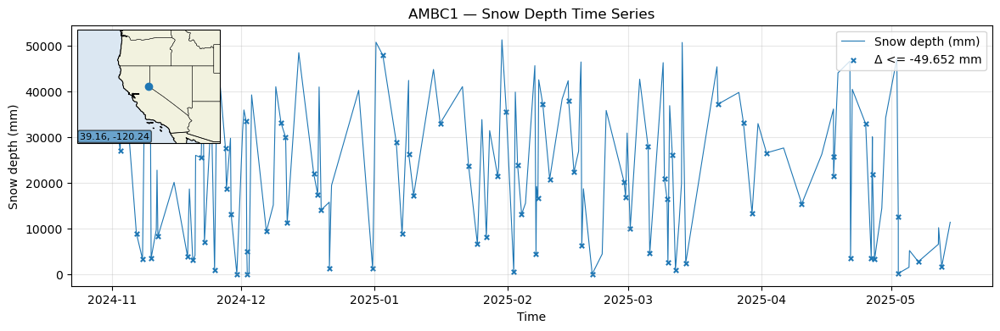

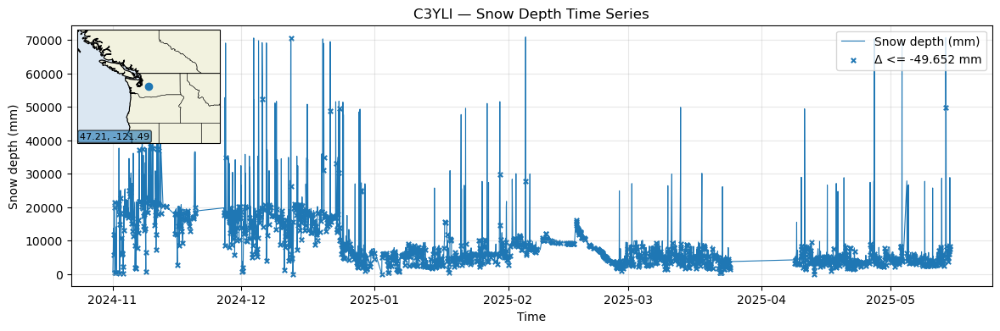

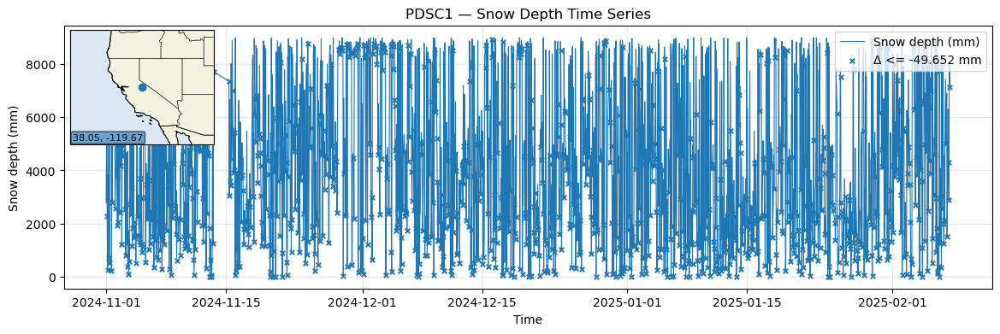

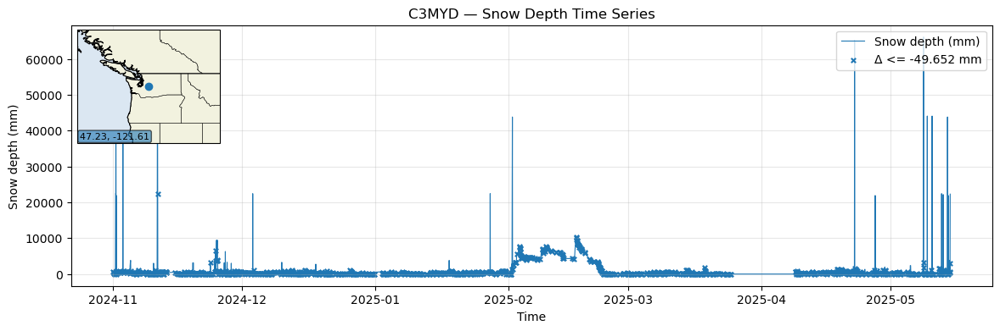

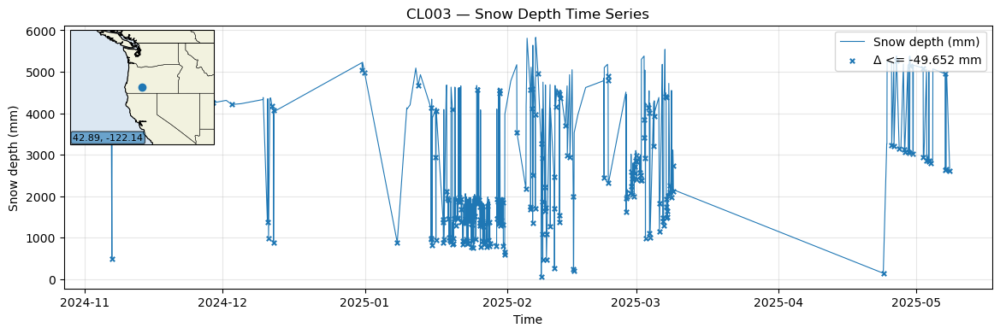

...

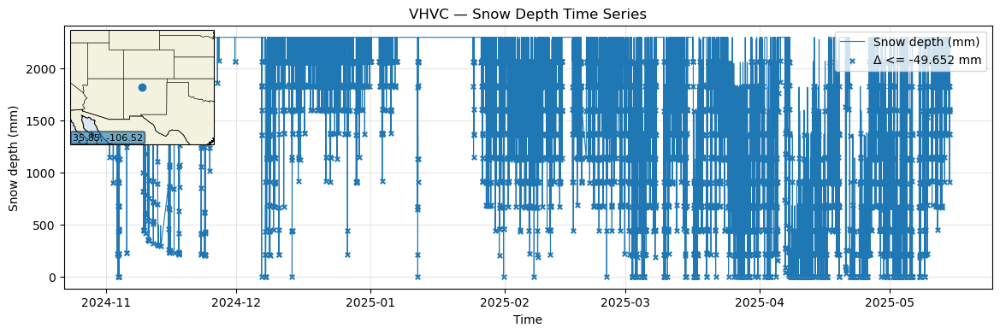

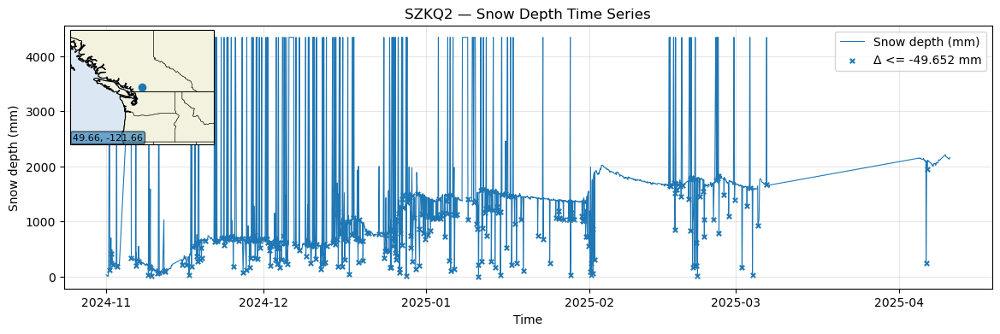

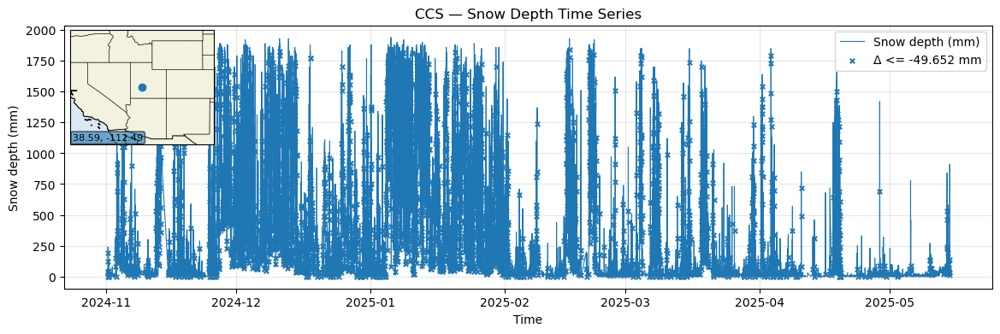

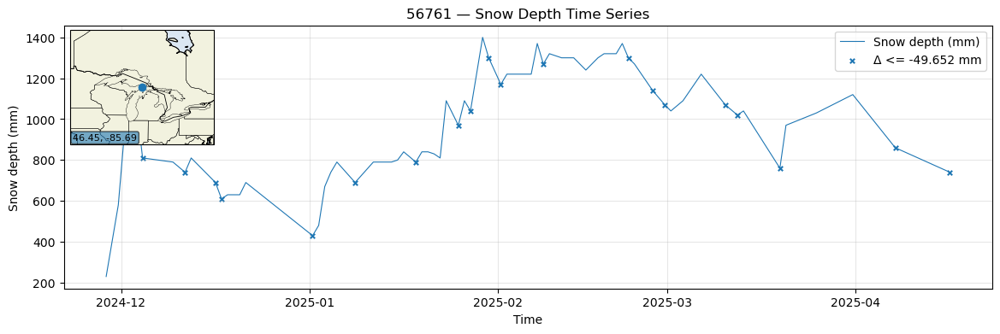

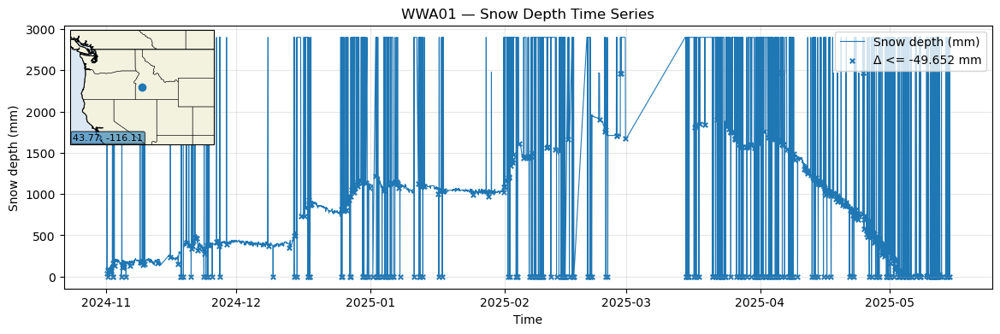

In [9]:
worst_ids = station_rank["station_id"].head(20).tolist()

for stid in worst_ids:
    out_png = f"snomad_snocvr_{stid}_negsteps.png"
    plot_station_timeseries_with_cartopy_map(
        df=df,                 # your original df is fine
        station_id=stid,
        step_threshold=meta["threshold_mm"],  # use the data-driven threshold
        out_png=out_png
    )

# Automate QC list based on three values:
* Pct_extreme >= 5% meaning that 1 out of every 20 reports is outside of this threshold
* N_melt_events >= 50, prevents false positives from low-data stations
* Neg_std_mm > 100, measures instability 


In [11]:


def identify_bad_stations(
    station_rank,
    pct_extreme_threshold=5,
    min_events=50,
    std_threshold=100,
):

    bad = station_rank[
        (station_rank["pct_extreme"] >= pct_extreme_threshold) &
        (station_rank["n_melt_events"] >= min_events) &
        (station_rank["neg_std_mm"] >= std_threshold)
    ]

    bad = bad.sort_values(
        ["pct_extreme", "neg_std_mm"],
        ascending=False

    return bad


bad_stations = identify_bad_stations(station_rank)
print("Number of total stations:", len(station_rank))
print("Number of bad stations:", len(bad_stations))

print(
    bad_stations[
        [
            "station_id",
            "pct_extreme",
            "neg_std_mm",
            "n_melt_events"
        ]
    ].head(20)
)

Number of total stations: 3465
Number of bad stations: 82
      station_id  pct_extreme    neg_std_mm  n_melt_events
8728       AMBC1    50.993377  11880.858075             77
10105      PDSC1    47.848761   2569.215913           1133
9156       C3YLI    43.257074   7463.005576           1647
9209       CL003    39.166667   1047.659424            295
10650      UTMVP    34.164634    201.825244          12918
9903       MCUES    32.869081    102.391987            179
9154       C3MYD    26.609658   5253.415115           1058
10104        PCT    26.362665    100.697295           1282
138        0291V    26.315789    321.006534             56
9186         CCS    22.790398    199.369077           7766
10703       VHVC    21.571174    282.468060           6648
9992       MTHO3    21.063967   1000.173794           1332
9320       DNKAW    20.755731    335.965687           6278
10153      PTFC1    20.701853    111.825062           6100
9694       JPRC1    19.507411    532.709341           152

In [12]:
print(
    bad_stations[
        [
            "station_id",
            "pct_extreme",
            "neg_std_mm",
            "n_melt_events"
        ]
    ]
)

      station_id  pct_extreme    neg_std_mm  n_melt_events
8728       AMBC1    50.993377  11880.858075             77
10105      PDSC1    47.848761   2569.215913           1133
9156       C3YLI    43.257074   7463.005576           1647
9209       CL003    39.166667   1047.659424            295
10650      UTMVP    34.164634    201.825244          12918
...          ...          ...           ...            ...
9611       HPAC2     5.033989    260.526431           1108
9789       LBNU1     5.031185    644.586807            911
9491       GQIA2     5.020673    288.929428            330
10099      PCKU1     5.014486   1125.717180            913
398        0925H     5.000000    357.122337             55

[82 rows x 4 columns]


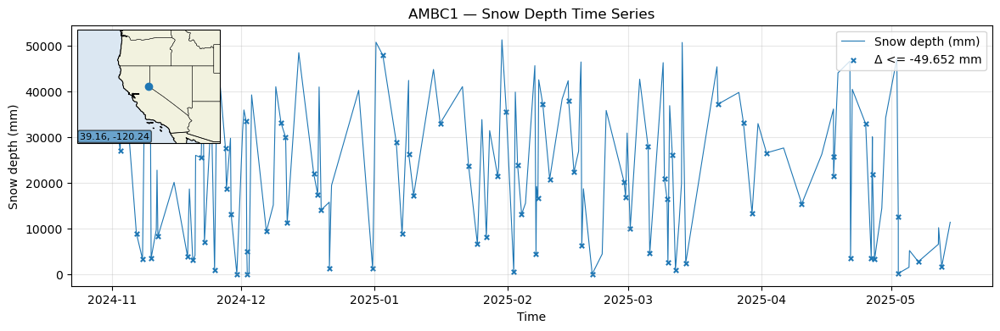

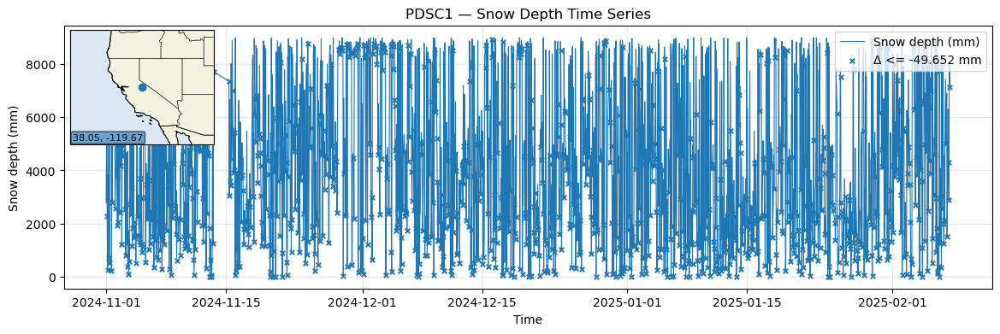

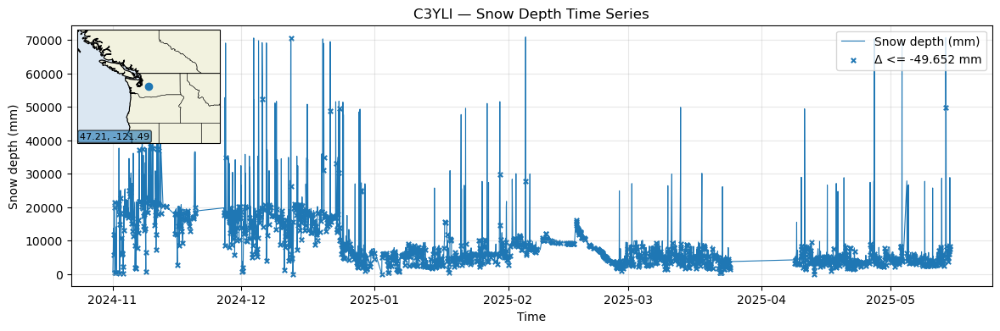

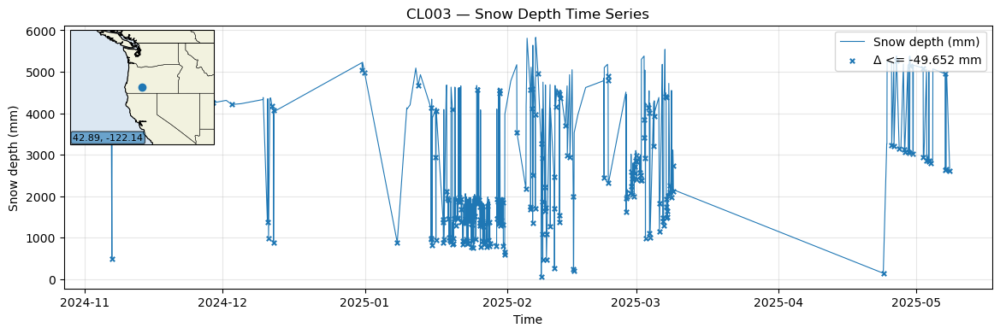

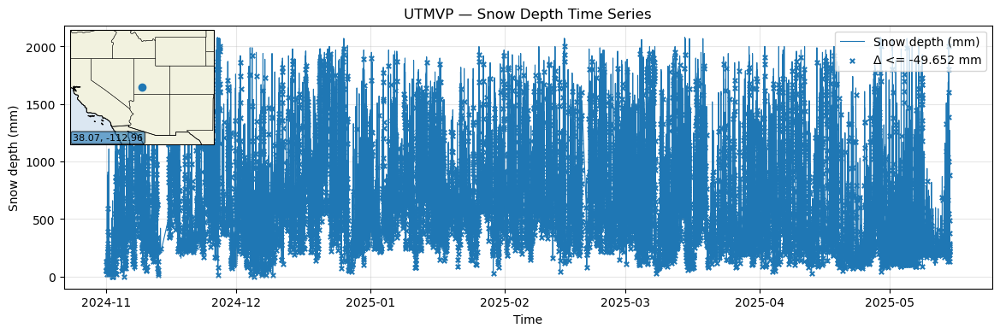

...

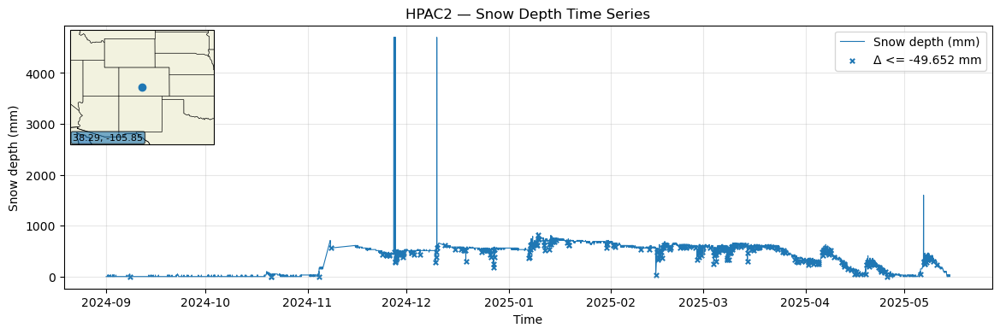

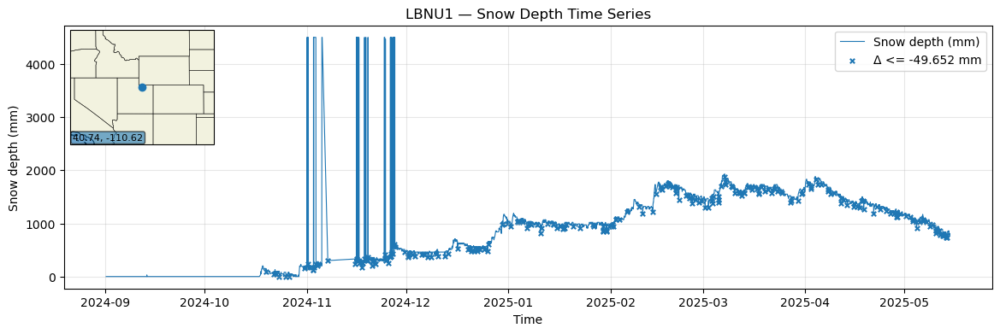

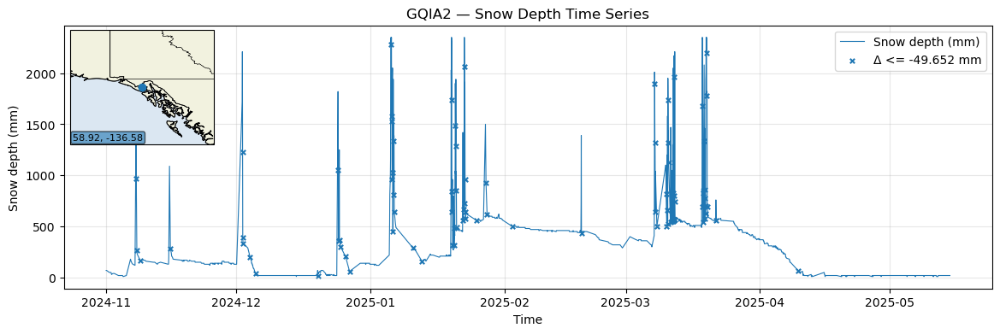

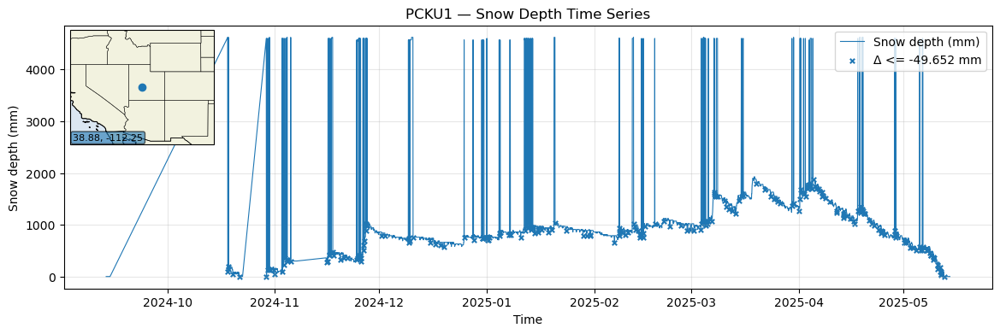

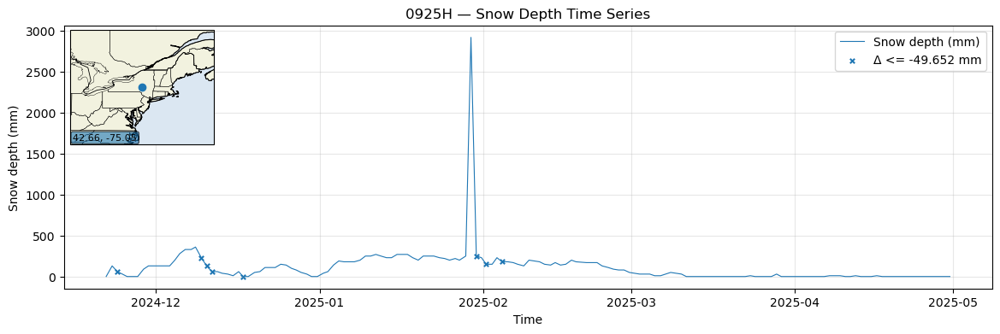

In [13]:
worst_ids = bad_stations["station_id"].tolist()

for stid in worst_ids:
    out_png = f"snomad_snocvr_{stid}_negsteps.png"
    plot_station_timeseries_with_cartopy_map(
        df=df,                 # your original df is fine
        station_id=stid,
        step_threshold=meta["threshold_mm"],  # use the data-driven threshold
        out_png=out_png
    )

In [14]:
def compute_monthly_station_metrics(df):

    d = df.copy()

    d["valid_time"] = pd.to_datetime(d["valid_time"])
    d["month"] = d["valid_time"].dt.to_period("M")

    d = d.sort_values(["station_id", "valid_time"])

    # First difference
    d["delta_mm"] = d.groupby("station_id")["obs_totalSnowDepth_mm"].diff()

    d["neg_delta_mm"] = d["delta_mm"].where(d["delta_mm"] < 0)

    # Global threshold already computed earlier
    threshold = -59.652  # example

    d["extreme_melt"] = d["neg_delta_mm"] < threshold

    monthly = (
        d.groupby(["station_id", "month"])
        .agg(
            n_obs=("obs_totalSnowDepth_mm", "count"),
            n_melt_events=("neg_delta_mm", lambda x: x.notna().sum()),
            pct_extreme=("extreme_melt", "mean"),
            neg_std_mm=("neg_delta_mm", "std"),
        )
        .reset_index()
    )

    monthly["pct_extreme"] *= 100

    return monthly


def label_bad_months(monthly):

    monthly["bad_month"] = (
        (monthly["pct_extreme"] >= 5) &
        (monthly["n_melt_events"] >= 20) &
        (monthly["neg_std_mm"] >= 100)
    )

    return monthly


def compute_station_status(monthly):

    monthly = monthly.sort_values(["station_id", "month"])

    def rolling_flags(g):

        g = g.copy()

        g["bad_month"] = g["bad_month"].astype(int)

        # Rolling bad count
        g["bad_last_3"] = (
            g["bad_month"]
            .rolling(window=3, min_periods=1)
            .sum()
        )

        # Rolling good count
        g["good_last_3"] = (
            (1 - g["bad_month"])
            .rolling(window=3, min_periods=1)
            .sum()
        )

        # Operational decisions
        g["boot_station"] = g["bad_last_3"] >= 2

        g["reinstate_station"] = g["good_last_3"] == 3

        return g

    status = (
        monthly
        .groupby("station_id")
        .apply(rolling_flags)
        .reset_index(drop=True)
    )

    return status

In [15]:
current_month = status["month"].max()

current_status = status[
    status["month"] == current_month
]

stations_to_boot = current_status[
    current_status["boot_station"]
]["station_id"].tolist()

stations_to_reinstate = current_status[
    current_status["reinstate_station"]
]["station_id"].tolist()

NameError: name 'status' is not defined